In [7]:
import numpy as np
from skimage.transform import (hough_line, hough_line_peaks, hough_circle,
hough_circle_peaks)
from skimage.draw import circle_perimeter
from skimage.feature import canny
from skimage.data import astronaut
from skimage.io import imread, imsave
from skimage.color import rgb2gray, gray2rgb, label2rgb
from skimage import img_as_float
from skimage.morphology import skeletonize
from skimage import data, img_as_float
import matplotlib.pyplot as pylab
from matplotlib import cm
from skimage.filters import sobel, threshold_otsu
from skimage.feature import canny
from skimage.segmentation import felzenszwalb, slic, quickshift, watershed
from skimage.segmentation import mark_boundaries, find_boundaries

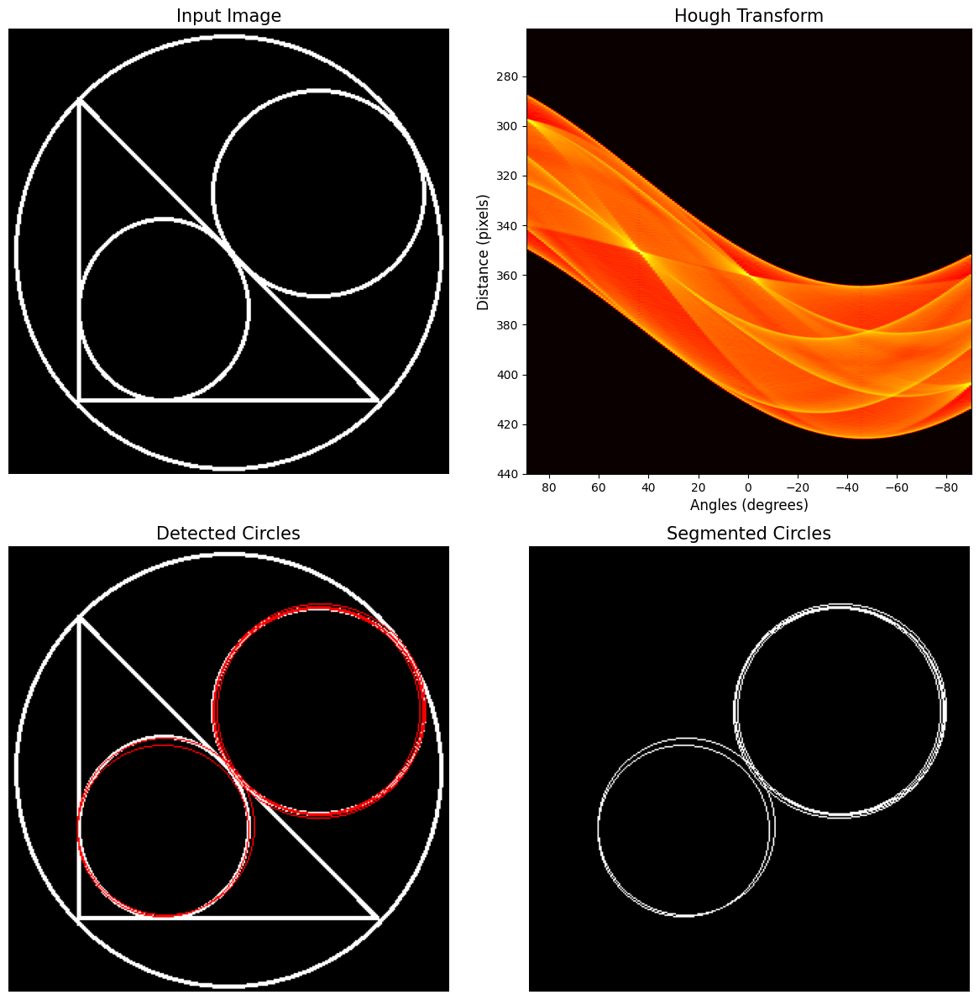

In [18]:
from skimage.color import rgb2gray, gray2rgb
from skimage.io import imread
from skimage.transform import hough_line, hough_line_peaks, hough_circle, hough_circle_peaks
from skimage.draw import circle_perimeter
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import cm

# Đọc ảnh và xử lý kênh alpha nếu có
image = imread('./images/triangle_circle.png')

# Kiểm tra nếu ảnh có kênh alpha (4 kênh)
if image.shape[-1] == 4:  
    image = image[..., :3]  # Lấy 3 kênh RGB

# Chuyển ảnh RGB sang grayscale
image = rgb2gray(image)

# --- 1. Hough Transform ---
h, theta, d = hough_line(image)

# --- 2. Circle Detection ---
hough_radii = np.arange(50, 100, 2)
hough_res = hough_circle(image, hough_radii)

# Lấy 6 vòng tròn nổi bật nhất
accums, c_x, c_y, radii = hough_circle_peaks(hough_res, hough_radii, total_num_peaks=6)

# Đánh dấu vòng tròn trên ảnh
segmented_image = np.zeros_like(image)
image_with_circles = gray2rgb(image)
for center_y, center_x, radius in zip(c_y, c_x, radii):
    circ_y, circ_x = circle_perimeter(center_y, center_x, radius)
    image_with_circles[circ_y, circ_x] = (1, 0, 0)  # Đánh dấu màu đỏ
    segmented_image[circ_y, circ_x] = 1

# --- 3. Hiển thị tất cả trên cùng một hình ---
fig, axes = plt.subplots(2, 2, figsize=(12, 12))  # Tạo lưới 2x2
axes = axes.ravel()

# Plot 1: Ảnh gốc
axes[0].imshow(image, cmap=cm.gray)
axes[0].set_title('Input Image', size=15)
axes[0].set_axis_off()

# Plot 2: Hough Transform
# Điều chỉnh phạm vi trục sao cho chiều rộng và chiều cao là bằng nhau
hough_width = np.rad2deg(theta[0]) - np.rad2deg(theta[-1])
hough_height = d[0] - d[-1]

# Tính tỷ lệ cần thiết để làm cho hình vuông
max_dim = max(hough_width, hough_height)

# Điều chỉnh phạm vi trục sao cho ảnh là vuông
axes[1].imshow(np.log(1 + h),
               extent=[np.rad2deg(theta[-1]), np.rad2deg(theta[-1]) + max_dim, d[-1], d[-1] + max_dim],
               cmap=cm.hot)
axes[1].set_title('Hough Transform', size=15)
axes[1].set_xlabel('Angles (degrees)', size=12)
axes[1].set_ylabel('Distance (pixels)', size=12)
axes[1].axis('image')  # Điều này sẽ đảm bảo trục có tỷ lệ đồng nhất


# Plot 3: Ảnh có vòng tròn phát hiện
axes[2].imshow(image_with_circles, cmap=cm.gray)
axes[2].set_title('Detected Circles', size=15)
axes[2].set_axis_off()

# Plot 4: Ảnh chỉ chứa vòng tròn
axes[3].imshow(segmented_image, cmap=cm.gray)
axes[3].set_title('Segmented Circles', size=15)
axes[3].set_axis_off()

# Căn chỉnh layout
plt.tight_layout()
plt.show()


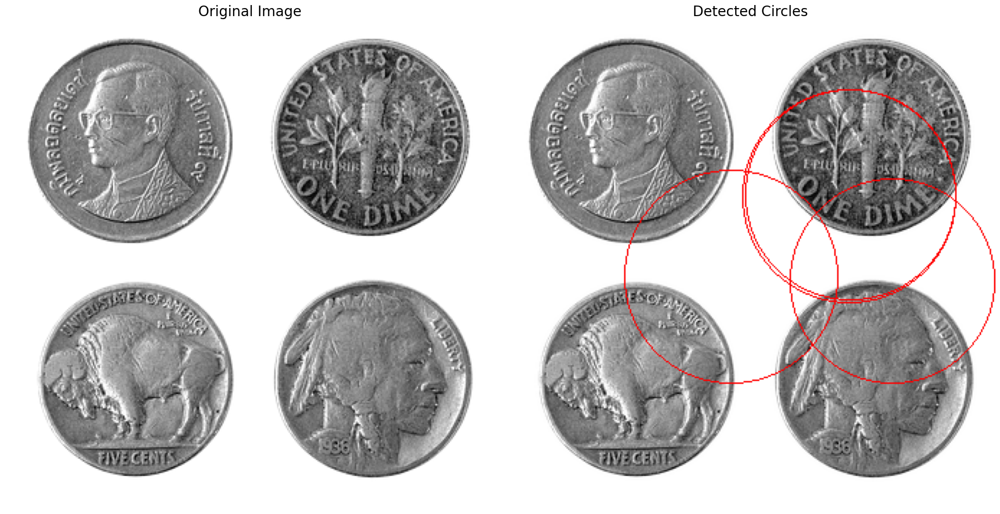

In [4]:
from skimage import color, io
import matplotlib.pyplot as plt
import numpy as np
from skimage.draw import circle_perimeter
from skimage.transform import hough_circle, hough_circle_peaks

# Đọc ảnh RGBA và chuyển thành RGB
image = io.imread('images/coins.png')
image_rgb = color.rgba2rgb(image)  # Loại bỏ kênh alpha

# Chuyển đổi ảnh RGB sang ảnh grayscale
gray_image = color.rgb2gray(image_rgb)

# Hiển thị ảnh gốc và ảnh đã phát hiện vòng tròn
fig, axes = plt.subplots(1, 2, figsize=(20, 10), sharex=True, sharey=True)
axes = axes.ravel()

# Plot ảnh gốc
axes[0].imshow(gray_image, cmap=plt.cm.gray)
axes[0].set_axis_off()
axes[0].set_title('Original Image', size=20)

# Hough Transform để phát hiện các vòng tròn
hough_radii = np.arange(65, 75, 1)
hough_res = hough_circle(gray_image, hough_radii)

# Lựa chọn 4 vòng tròn nổi bật nhất
accums, c_x, c_y, radii = hough_circle_peaks(hough_res, hough_radii, total_num_peaks=4)

# Chuyển lại ảnh grayscale thành ảnh RGB để vẽ vòng tròn màu đỏ
image_rgb = color.gray2rgb(gray_image)
for center_y, center_x, radius in zip(c_y, c_x, radii):
    circ_y, circ_x = circle_perimeter(center_y, center_x, radius)
    image_rgb[circ_y, circ_x] = (1, 0, 0)  # Vẽ vòng tròn màu đỏ

# Plot ảnh đã phát hiện vòng tròn
axes[1].imshow(image_rgb, cmap=plt.cm.gray)
axes[1].set_axis_off()
axes[1].set_title('Detected Circles', size=20)

plt.tight_layout()
plt.show()


hresholding and Otsu's segmentation

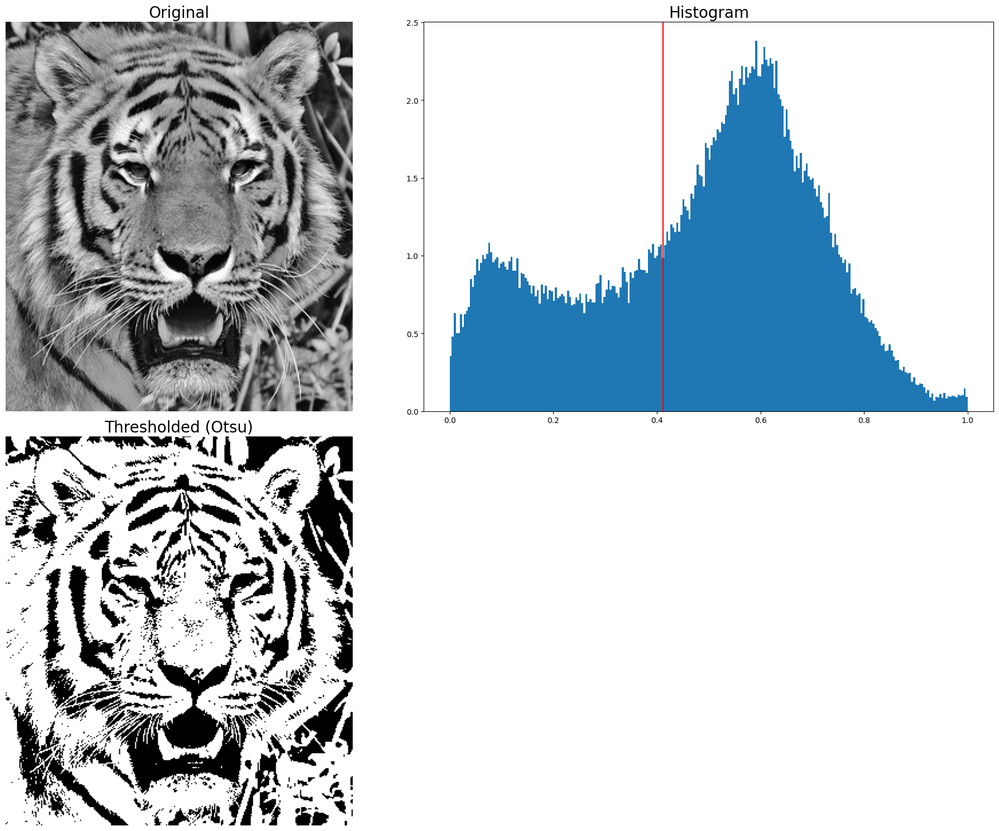

In [14]:
image = rgb2gray(imread('./images/tiger3.jpg'))
thresh = threshold_otsu(image)
binary = image > thresh

fig, axes = pylab.subplots(nrows=2, ncols=2, figsize=(20, 15))
axes = axes.ravel()

axes[0].imshow(image, cmap=pylab.cm.gray)
axes[0].set_title('Original', size=20)
axes[0].axis('off')

axes[1].hist(image.ravel(), bins=256, density=True)
axes[1].set_title('Histogram', size=20)
axes[1].axvline(thresh, color='r')

axes[2].imshow(binary, cmap=pylab.cm.gray)
axes[2].set_title('Thresholded (Otsu)', size=20)
axes[2].axis('off')

axes[3].axis('off')
pylab.tight_layout()
pylab.show()


Felzenszwalb's efficient graph-based image
segmentation

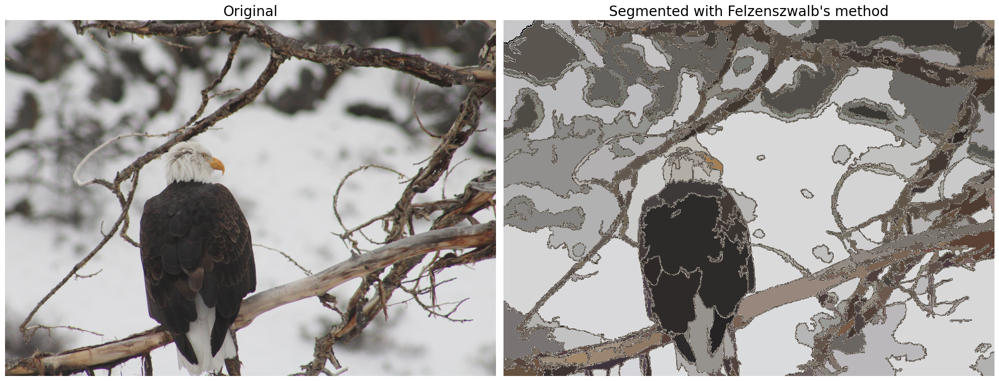

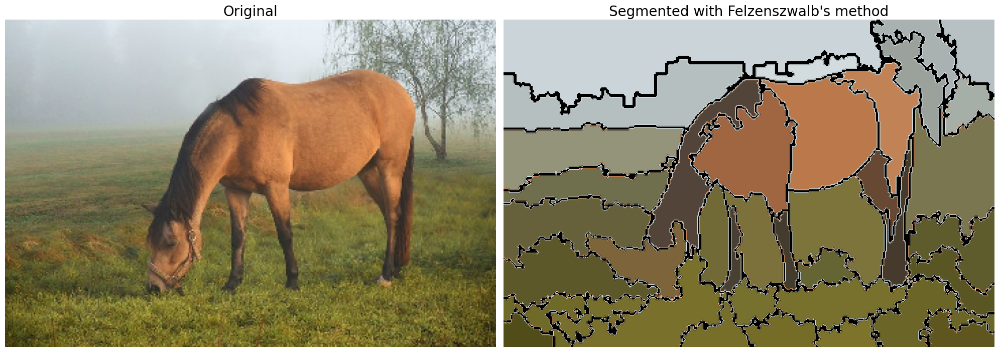

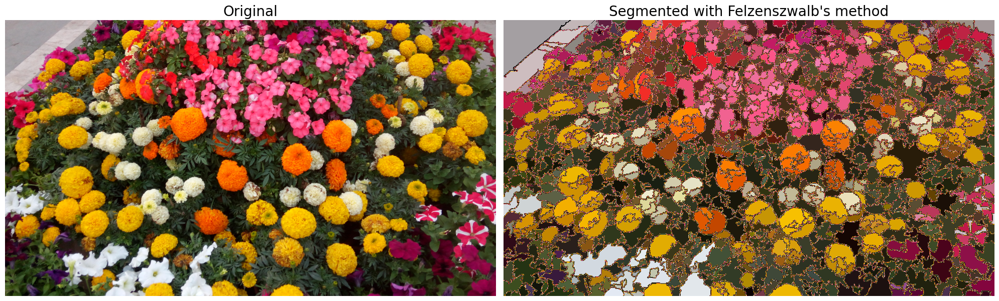

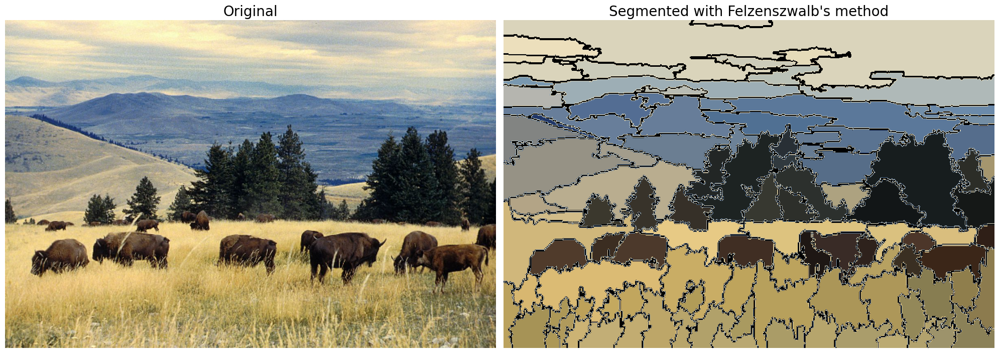

In [19]:
from skimage.io import imread
from skimage.util import img_as_float
from skimage.segmentation import felzenszwalb, find_boundaries
from matplotlib.colors import LinearSegmentedColormap
import matplotlib.pyplot as plt
import numpy as np

# Danh sách ảnh cần xử lý
image_files = [
    './images/eagle.jpg', 
    './images/horses.jpg',
    './images/flowers.png', 
    './images/bisons.jpg'
]

# Duyệt qua từng ảnh
for imfile in image_files:
    # Đọc và tiền xử lý ảnh
    img = img_as_float(imread(imfile)[::2, ::2, :3])  # Đọc ảnh, giảm kích thước
    segments_fz = felzenszwalb(img, scale=100, sigma=0.5, min_size=400)  # Áp dụng Felzenszwalb

    # Tìm đường viền và tạo ảnh màu độc đáo
    borders = find_boundaries(segments_fz)
    unique_colors = np.unique(segments_fz.ravel())
    segments_fz[borders] = -1  # Đánh dấu viền bằng giá trị -1
    colors = [np.zeros(3)]  # Màu mặc định cho các vùng
    for color in unique_colors:
        colors.append(np.mean(img[segments_fz == color], axis=0))

    # Tạo bảng màu từ các màu trung bình
    cm = LinearSegmentedColormap.from_list('palette', colors, N=len(colors))

    # Vẽ hình
    fig, ax = plt.subplots(1, 2, figsize=(20, 10))

    ax[0].imshow(img)
    ax[0].set_title('Original', size=20)
    ax[0].axis('off')

    ax[1].imshow(segments_fz, cmap=cm)
    ax[1].set_title("Segmented with Felzenszwalb's method", size=20)
    ax[1].axis('off')

    plt.tight_layout()
    plt.show()
